In [1]:
pip install pycocotools opencv-python numpy tqdm albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.5/41.5 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.1/80.1 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 258.5 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 458.7/458.7 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.6/289.6 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.6/307.6 kB 18.9 MB/s eta 0:00:00


In [2]:
!mkdir coco
!cd coco && wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!cd coco && wget http://images.cocodataset.org/zips/train2017.zip
!cd coco && wget http://images.cocodataset.org/zips/val2017.zip
!cd coco && unzip annotations_trainval2017.zip
!cd coco && unzip train2017.zip
!cd coco && unzip val2017.zip



Streaming output truncated to the last 5000 lines.
 extracting: val2017/000000212226.jpg  
 extracting: val2017/000000231527.jpg  
 extracting: val2017/000000578922.jpg  
 extracting: val2017/000000062808.jpg  
 extracting: val2017/000000119038.jpg  
 extracting: val2017/000000114871.jpg  
 extracting: val2017/000000463918.jpg  
 extracting: val2017/000000365745.jpg  
 extracting: val2017/000000320425.jpg  
 extracting: val2017/000000481404.jpg  
 extracting: val2017/000000314294.jpg  
 extracting: val2017/000000335328.jpg  
 extracting: val2017/000000513688.jpg  
 extracting: val2017/000000158548.jpg  
 extracting: val2017/000000132116.jpg  
 extracting: val2017/000000415238.jpg  
 extracting: val2017/000000321333.jpg  
 extracting: val2017/000000081738.jpg  
 extracting: val2017/000000577584.jpg  
 extracting: val2017/000000346905.jpg  
 extracting: val2017/000000433980.jpg  
 extracting: val2017/000000228144.jpg  
 extracting: val2017/000000041872.jpg  
 extracting: val2017/00000011

In [3]:
import json
import os

# Define paths
coco_annotation_path = 'coco/annotations/instances_train2017.json'
filtered_annotation_path = 'coco/annotations/instances_train2017_small.json'
SMALL_OBJECT_THRESHOLD = 32 * 32  # 1024 px²

# Load COCO Annotations
with open(coco_annotation_path, 'r') as f:
    coco_data = json.load(f)

small_annotations = []
small_image_ids = set()

# Filter annotations with small objects
for ann in coco_data['annotations']:
    area = ann["bbox"][2] * ann["bbox"][3]  # width * height
    if area < SMALL_OBJECT_THRESHOLD:
        small_annotations.append(ann)
        small_image_ids.add(ann["image_id"])

# Filter images that contain small objects
filtered_images = [img for img in coco_data['images'] if img['id'] in small_image_ids]

# Save new dataset
filtered_coco_data = {
    "info": coco_data.get("info", {}),
    "licenses": coco_data.get("licenses", []),
    "images": filtered_images,
    "annotations": small_annotations,
    "categories": coco_data.get("categories", [])
}

with open(filtered_annotation_path, 'w') as f:
    json.dump(filtered_coco_data, f)

print(f"Filtered dataset saved at {filtered_annotation_path}")


Filtered dataset saved at coco/annotations/instances_train2017_small.json


In [4]:
!pip install albumentations==1.3.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.5/123.5 kB 4.4 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 2.0.4
    Uninstalling albumentations-2.0.4:
      Successfully uninstalled albumentations-2.0.4


In [5]:
!pip cache purge
!pip install --upgrade numpy albumentations scikit-image scipy


Files removed: 46
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.5/41.5 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 87.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.6/289.6 kB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.6/37.6 MB 35.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.3.0
    Uninstalling albumentations-1.3.0:
      Successfully uninstalled albumentations-1.3.0
ERROR: pip's depe

In [7]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu124

Looking in indexes: https://download.pytorch.org/whl/cu124


In [16]:
!pip install --upgrade --force-reinstall albumentations opencv-python-headless numpy scikit-image scipy

  Using cached albumentations-2.0.4-py3-none-any.whl.metadata (41 kB)
  Using cached numpy-2.2.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
  Using cached scipy-1.15.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.1/80.1 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 4.3 MB/s eta 0:00:00
Using cached albumentations-2.0.4-py3-none-any.whl (289 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 25.6 MB/s eta 0:00:00
Using cached numpy-2.2.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.4 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 96.4 MB/s eta 0:00:00
Using cached scipy-1.15.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (37.6 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.8/315.8 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 48.6 MB/s eta 0:00:0

In [3]:
import os
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
import json

# Updated transform using 'size' instead of separate height and width
transform = A.Compose([
    A.RandomResizedCrop(size=(640, 640), scale=(0.5, 1.0), ratio=(0.75, 1.333),
                          interpolation=cv2.INTER_LINEAR, mask_interpolation=cv2.INTER_LINEAR, p=1.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.GaussNoise(var_limit=(10, 50), p=0.3),
    ToTensorV2()
])

# Path to your filtered annotations (make sure filtered_annotation_path is defined)
filtered_annotation_path = 'coco/annotations/instances_train2017_small.json'

# Load filtered dataset
with open(filtered_annotation_path, 'r') as f:
    filtered_coco_data = json.load(f)

image_dir = "coco/train2017/"
augmented_dir = "coco/train2017_augmented/"
os.makedirs(augmented_dir, exist_ok=True)

for img_info in filtered_coco_data['images']:
    img_path = os.path.join(image_dir, img_info['file_name'])
    image = cv2.imread(img_path)
    if image is None:
        print(f"Warning: Image {img_info['file_name']} not found.")
        continue

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Apply augmentation transform
    augmented = transform(image=image)
    aug_img = augmented['image']

    # Convert the PyTorch tensor to a NumPy array and permute dimensions from (C, H, W) to (H, W, C)
    aug_img = aug_img.permute(1, 2, 0).numpy()

    aug_img_path = os.path.join(augmented_dir, img_info['file_name'])
    # Convert RGB back to BGR for cv2.imwrite
    cv2.imwrite(aug_img_path, cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR))

print(f"Augmented images saved in {augmented_dir}")



<ipython-input-3-eb3bcc2e8ee3>:15: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=0.3),


Augmented images saved in coco/train2017_augmented/


In [4]:
import json

# Path to your filtered annotations (same as used in your previous code)
filtered_annotation_path = 'coco/annotations/instances_train2017_small.json'

# Load the filtered COCO data
with open(filtered_annotation_path, 'r') as f:
    data = json.load(f)

# Total number of images in the filtered dataset
total_images = len(data['images'])

# Create a dictionary to map each category ID to a set of image IDs that contain that category
category_image_map = {cat['id']: set() for cat in data['categories']}

# Loop through all annotations to fill the mapping
for ann in data['annotations']:
    cat_id = ann['category_id']
    image_id = ann['image_id']
    category_image_map[cat_id].add(image_id)

# Print out the number of images for each category
print("Category counts (number of images per category) in the filtered (small object) dataset:")
for cat in data['categories']:
    cat_id = cat['id']
    image_count = len(category_image_map[cat_id])
    print(f"Category '{cat['name']}' (ID: {cat_id}): {image_count} images")

# Also, print the total number of categories
total_categories = len(data['categories'])
print(f"\nTotal number of categories: {total_categories}")

# Print the overall total number of images in the filtered dataset
print(f"Total number of images in the filtered dataset: {total_images}")


Category counts (number of images per category) in the filtered (small object) dataset:
Category 'person' (ID: 1): 20200 images
Category 'bicycle' (ID: 2): 944 images
Category 'car' (ID: 3): 6943 images
Category 'motorcycle' (ID: 4): 628 images
Category 'airplane' (ID: 5): 340 images
Category 'bus' (ID: 6): 361 images
Category 'train' (ID: 7): 73 images
Category 'truck' (ID: 8): 1280 images
Category 'boat' (ID: 9): 1312 images
Category 'traffic light' (ID: 10): 3088 images
Category 'fire hydrant' (ID: 11): 347 images
Category 'stop sign' (ID: 13): 485 images
Category 'parking meter' (ID: 14): 266 images
Category 'bench' (ID: 15): 1444 images
Category 'bird' (ID: 16): 1240 images
Category 'cat' (ID: 17): 52 images
Category 'dog' (ID: 18): 299 images
Category 'horse' (ID: 19): 349 images
Category 'sheep' (ID: 20): 554 images
Category 'cow' (ID: 21): 540 images
Category 'elephant' (ID: 22): 150 images
Category 'bear' (ID: 23): 10 images
Category 'zebra' (ID: 24): 151 images
Category 'gira

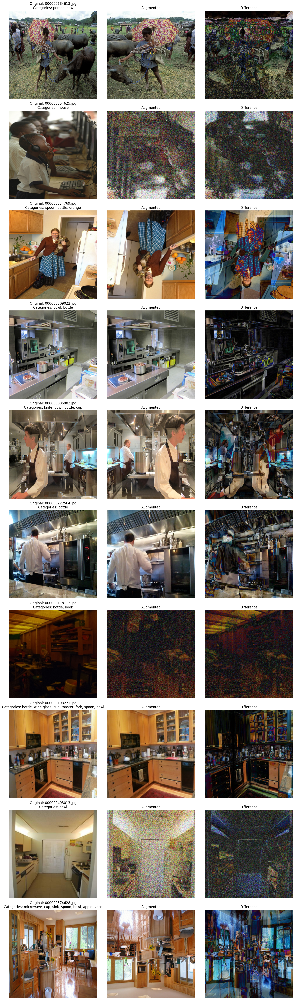

In [7]:
import os
import cv2
import json
import matplotlib.pyplot as plt
import numpy as np

# Define directories and annotation file
original_dir = "coco/train2017/"
augmented_dir = "coco/train2017_augmented/"
filtered_annotation_path = 'coco/annotations/instances_train2017_small.json'

# Load the filtered dataset annotations
with open(filtered_annotation_path, 'r') as f:
    filtered_data = json.load(f)

# Create a mapping from category_id to category_name
cat_id_to_name = {cat['id']: cat['name'] for cat in filtered_data['categories']}

# Build a mapping from image_id to a set of category IDs that appear in that image
image_id_to_cats = {}
for ann in filtered_data['annotations']:
    img_id = ann['image_id']
    cat_id = ann['category_id']
    if img_id not in image_id_to_cats:
        image_id_to_cats[img_id] = set()
    image_id_to_cats[img_id].add(cat_id)

# Select 10 images for comparison (using the first 10 images in the dataset)
images_info = filtered_data['images'][:10]

# Create a figure with 3 columns: Original, Augmented, and Difference image
num_images = len(images_info)
plt.figure(figsize=(15, 5 * num_images))

for i, img_info in enumerate(images_info):
    file_name = img_info['file_name']
    image_id = img_info['id']
    original_path = os.path.join(original_dir, file_name)
    augmented_path = os.path.join(augmented_dir, file_name)

    # Read images using cv2 (which loads in BGR format)
    orig_img = cv2.imread(original_path)
    aug_img = cv2.imread(augmented_path)

    # Skip if the image file is not found
    if orig_img is None or aug_img is None:
        print(f"Skipping {file_name} due to missing file.")
        continue

    # Convert images from BGR to RGB for displaying with matplotlib
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    aug_img = cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB)

    # Resize original image to 640x640 to match the augmented image dimensions
    orig_resized = cv2.resize(orig_img, (640, 640))

    # Compute the absolute difference between the resized original and augmented image
    diff_img = cv2.absdiff(orig_resized, aug_img)

    # Retrieve all category IDs for this image, then map them to names
    if image_id in image_id_to_cats:
        cat_ids = image_id_to_cats[image_id]
        cat_names = [cat_id_to_name[cid] for cid in cat_ids]
        cat_names_str = ", ".join(cat_names)
    else:
        cat_names_str = "No categories"

    # Plot Original image
    plt.subplot(num_images, 3, 3 * i + 1)
    plt.imshow(orig_resized)
    plt.title(f"Original: {file_name}\nCategories: {cat_names_str}")
    plt.axis("off")

    # Plot Augmented image
    plt.subplot(num_images, 3, 3 * i + 2)
    plt.imshow(aug_img)
    plt.title("Augmented")
    plt.axis("off")

    # Plot Difference image
    plt.subplot(num_images, 3, 3 * i + 3)
    plt.imshow(diff_img)
    plt.title("Difference")
    plt.axis("off")

plt.tight_layout()
plt.show()
